In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns


import os

import cv2
from sklearn.preprocessing import LabelEncoder

from skimage import feature
from skimage.feature import hog
from skimage.feature import local_binary_pattern
from skimage import img_as_ubyte

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
import pickle

import warnings
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score, roc_auc_score, confusion_matrix

interpolation=cv2.INTER_AREA: This part of the code specifies the interpolation method used for resizing. Interpolation is a method for estimating pixel values at non-integer coordinates when you resize an image. In this case, cv2.INTER_AREA specifies the use of the area-based resampling interpolation method, which is generally a good choice for downscaling (making the image smaller) as it tends to produce smoother results.

In [2]:
traindata_resized_plain_path = "../Dataset/Resized_Images_256/Plain/"
traindata_resized_pothole_path = "../Dataset/Resized_Images_256/Pothole/"
img_path = [os.path.join(traindata_resized_plain_path,filename) for filename in os.listdir(traindata_resized_plain_path)] + \
    [os.path.join(traindata_resized_pothole_path,filename) for filename in os.listdir(traindata_resized_pothole_path)]
img_class = ["Plain" if "plain" in path.lower() else "Pothole" if "pothole" in path.lower() else "Unknown" for path in img_path]
data = {"path":img_path,"class":img_class}
dfr=pd.DataFrame(data)
dfr

,path,class
0,../Dataset/Resized_Images_256/Plain/1.6.png,Plain
1,../Dataset/Resized_Images_256/Plain/1.Longests...,Plain
2,../Dataset/Resized_Images_256/Plain/1.maxresde...,Plain
3,../Dataset/Resized_Images_256/Plain/1.png,Plain
4,../Dataset/Resized_Images_256/Plain/1.smooth_r...,Plain
...,...,...
718,../Dataset/Resized_Images_256/Pothole/95.BNG-L...,Pothole
719,../Dataset/Resized_Images_256/Pothole/96.sei_3...,Pothole
720,../Dataset/Resized_Images_256/Pothole/97.10551...,Pothole
721,../Dataset/Resized_Images_256/Pothole/98.5b5f7...,Pothole


## Texture:

Texture of an image can be defined as surface characteristics of image. Texture can be distinguished by variation of color, contrast and depth.


## Local Binary Patterns

Local binary patterns (lbp) is a texture descriptor, so it identifies local texture patterns by identifying each pixel’s intensity with its neighboring pixels. It represents the identified pattern into binary numbers. By calculating the histograms of these patterns throughout the different regions of the image a feature representation that defines the local texture information can be calculated. This feature can be useful for performing texture classification as it encodes the information about the image's texture and local patterns. 

the goal of it is to define texture in form of relationship between pixel values in local neighborhood. Hence Local Binary patterns are robust to changes in lighting conditions and contrast.


### To Check whether lbp features can be used for pothole classification we can visualise lbp image

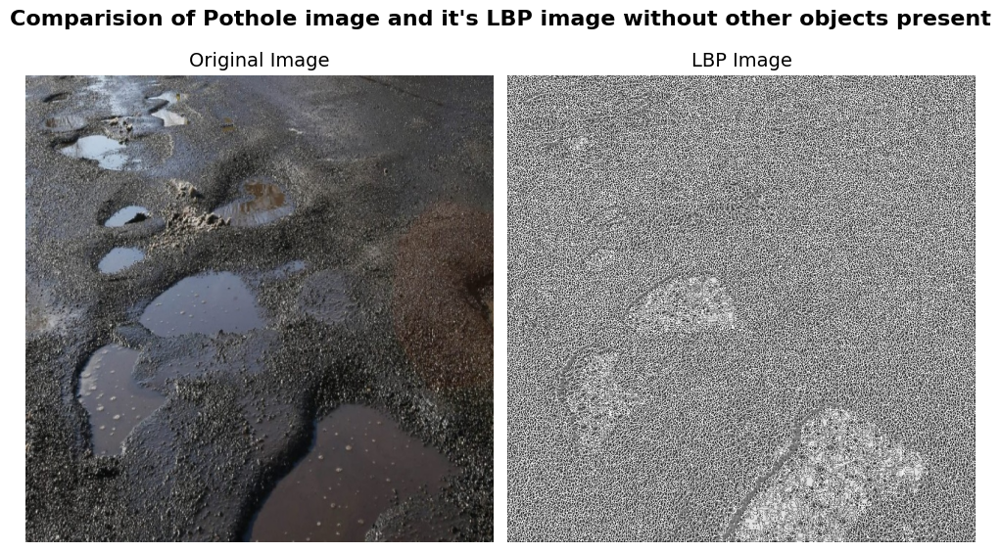

In [42]:
original_image_gray = cv2.imread('/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/279.potholes-GEE1-930x590.jpg', cv2.IMREAD_GRAYSCALE)
original_image_color = cv2.cvtColor( cv2.imread('/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/279.potholes-GEE1-930x590.jpg'),cv2.COLOR_BGR2RGB)
radius = 1
n_points = 8 * radius
lbp_image = feature.local_binary_pattern(original_image_gray,n_points,radius,method='uniform')
lbp_image = np.uint8((lbp_image / lbp_image.max()) * 255)

fig,axes = plt.subplots(1,2,figsize = (10,6))

axes[0].imshow(original_image_color)
axes[0].axis("off")
axes[0].set_title("Original Image", fontsize=14)

axes[1].imshow(lbp_image, cmap='gray')
axes[1].axis('off')
axes[1].set_title("LBP Image", fontsize=14) 

figure_title = "Comparision of Pothole image and it's LBP image without other objects present"
fig.suptitle(figure_title,fontweight = "bold",fontsize = 16)

fig.tight_layout()


### From the LBP image we can see that LBP identifies and highlights the pothole which are varying patterns in the road, it basically highlights abrupt changes in texture and edges or boundaries.

### Here, another question arises which is that what if there’s and object such as car in the image does it still highlights

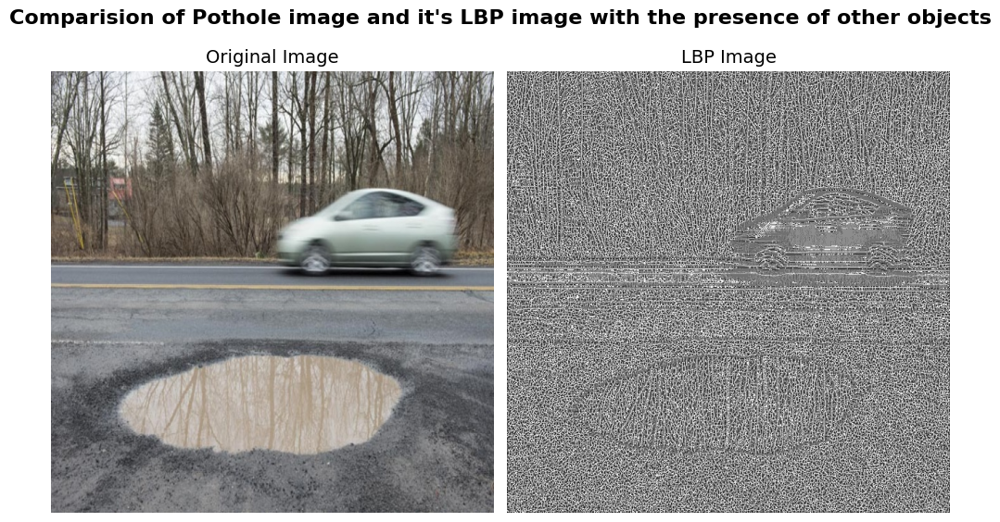

In [43]:
original_image_gray = cv2.imread('/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/339.potholes-700x467.jpg', cv2.IMREAD_GRAYSCALE)
original_image_color = cv2.cvtColor( cv2.imread('/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/339.potholes-700x467.jpg'),cv2.COLOR_BGR2RGB)
radius = 1
n_points = 8 * radius
lbp_image = feature.local_binary_pattern(original_image_gray,n_points,radius,method='uniform')
lbp_image = np.uint8((lbp_image / lbp_image.max()) * 255)
fig,axes = plt.subplots(1,2,figsize = (10,6))

axes[0].imshow(original_image_color)
axes[0].axis("off")
axes[0].set_title("Original Image", fontsize=14)

axes[1].imshow(lbp_image, cmap='gray')
axes[1].axis('off')
axes[1].set_title("LBP Image", fontsize=14) 

figure_title = "Comparision of Pothole image and it's LBP image with the presence of other objects"
fig.suptitle(figure_title,fontweight = "bold",fontsize = 16)

plt.tight_layout()
plt.show()

### From the plots we can clearly see that Pothole region is highlighted alongside with car. but since it has pothole region highlighted car wont affect the model as the dominat feature/pattern in the Pothole class will still be of pothole

### For classification, alongside with identification of pothole features it is also important that plain images have homogenous patterns on the roads since texture of road remains same in the absence of potholes

### 

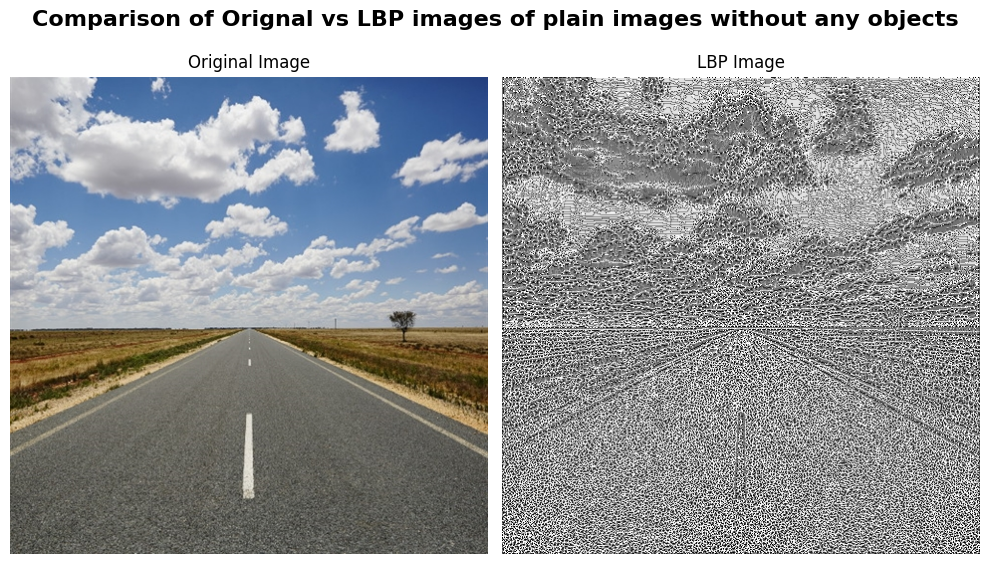

In [44]:
original_image_gray = cv2.imread('/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/train/Plain/2.federation-way-1.jpg', cv2.IMREAD_GRAYSCALE)
original_image_color = cv2.cvtColor( cv2.imread('/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/train/Plain/2.federation-way-1.jpg'),cv2.COLOR_BGR2RGB)
radius = 1
n_points = 8 * radius
lbp_image = feature.local_binary_pattern(original_image_gray,n_points,radius,method='uniform')
lbp_image = np.uint8((lbp_image / lbp_image.max()) * 255)
fig, axs = plt.subplots(1, 2, figsize=(10, 6))

# Subplot 1: Original Image
axs[0].imshow(original_image_color)
axs[0].axis('off')
axs[0].set_title("Original Image", fontsize=12)  

# Subplot 2: LBP Image
axs[1].imshow(lbp_image, cmap='gray')
axs[1].axis('off')
axs[1].set_title("LBP Image", fontsize=12)  

figure_title = "Comparison of Orignal vs LBP images of plain images without any objects"
plt.suptitle(figure_title, fontsize=16,fontweight = "bold")

plt.tight_layout()

plt.show()

Confirming the inference from the above plot in different scenarios/type of images.

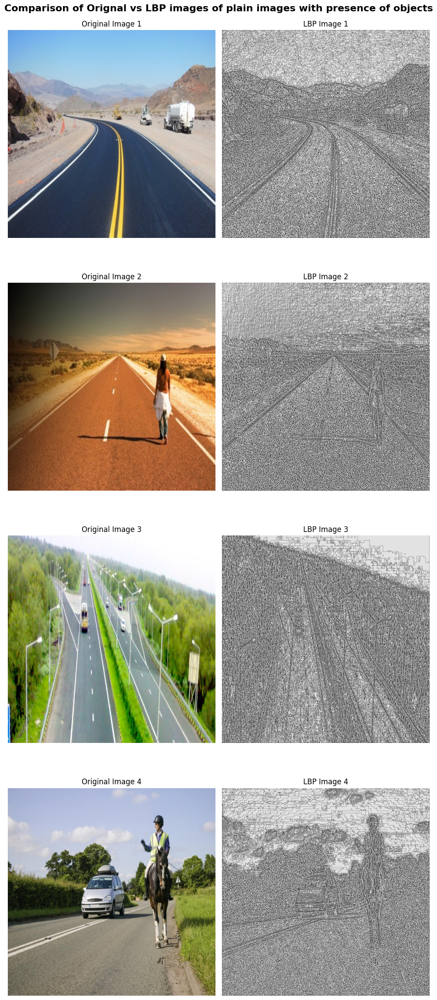

In [45]:
import matplotlib.pyplot as plt
import cv2
from skimage import feature
import numpy as np

# Define the paths to the images
image_paths = [
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/1.smooth_road_resize_md.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/116.road-to-ruin-report-cover-web-graphic-486x271.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/283.road-071112-feature.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/48.Horse%20on%20country%20road.jpg"
]

fig, axs = plt.subplots(len(image_paths), 2, figsize=(10, 6*len(image_paths)))

for i, image_path in enumerate(image_paths):
    original_image_color = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    original_image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Calculate LBP image
    radius = 1
    n_points = 8 * radius
    lbp_image = feature.local_binary_pattern(original_image_gray, n_points, radius, method='uniform')
    lbp_image = np.uint8((lbp_image / lbp_image.max()) * 255)

    # Subplot 1: Original Image
    axs[i, 0].imshow(original_image_color)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"Original Image {i+1}", fontsize=12)

    # Subplot 2: LBP Image
    axs[i, 1].imshow(lbp_image, cmap='gray')
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"LBP Image {i+1}", fontsize=12)

# Set a common figure title above the subplots
figure_title = "Comparison of Orignal vs LBP images of plain images with presence of objects"
plt.suptitle(figure_title, fontsize=16, fontweight="bold")

plt.tight_layout()

plt.show()


## Conclusion

### The patterns on the plain images stays homogenous because of the absence of potholes and we can clearly see the difference in the patterns on the roads where potholes can be observed

# Function for extraction of Local Binary Patterns of images

In [3]:
def extract_lbp_features_noise(image_path, radius=1, n_points=8):
    try:

        image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        image = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
        image = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
        image = img_as_ubyte(image)

        lbp_image = local_binary_pattern(image, n_points, radius, method='uniform')
        
        # Calculating the histogram of the LBP image
        lbp_hist, _ = np.histogram(lbp_image.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
        
        # Normalizing the histogram
        lbp_hist = lbp_hist.astype("float")
        lbp_hist /= (lbp_hist.sum() + 1e-8)
        
        return lbp_hist
    except Exception as e:
        print(f"Error processing image '{image_path}': {str(e)}")
        return None

In [4]:
def extract_lbp_features(image_path, radius=1, n_points=8):
    try:

        image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        image = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
        image = img_as_ubyte(image)

        lbp_image = local_binary_pattern(image, n_points, radius, method='uniform')
        
        # Calculating the histogram of the LBP image
        lbp_hist, _ = np.histogram(lbp_image.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
        
        # Normalizing the histogram
        lbp_hist = lbp_hist.astype("float")
        lbp_hist /= (lbp_hist.sum() + 1e-8)
        
        return lbp_hist
    except Exception as e:
        print(f"Error processing image '{image_path}': {str(e)}")
        return None

### function details 
Total 8 neighboring pixels will be considered since radius is 1 and n_points is 8, It can be considered 3*3 matrix.

No of bins in histogram of each image will be 10.

each histogram will be normalized, hence making the features scale invariant. (i.e., will not be affected by size or brightness)

1e-8 is a very small number to avoid division by zero while normalizing the values.



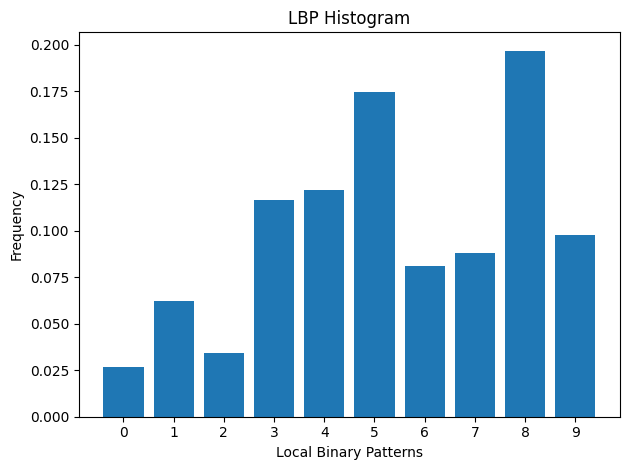

In [48]:
def plot_lbp_histogram(image_path, radius=1, n_points=8):
    lbp_hist = extract_lbp_features(image_path, radius, n_points)
    
    if lbp_hist is not None:
        plt.figure()
        plt.title("LBP Histogram")
        plt.bar(np.arange(len(lbp_hist)), lbp_hist, tick_label=np.arange(len(lbp_hist)))
        plt.xlabel("Local Binary Patterns")
        plt.ylabel("Frequency")
        plt.tight_layout()
        plt.show()

image_path = "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/1.smooth_road_resize_md.jpg"
plot_lbp_histogram(image_path)


This is how a LBP histogram looks like

# Gradient

The Gradient is the definitive term for variation in the pixel intensities within an image

## Gradient Magnitude: 
it represents strength or intensity of the change in pixel values.it is calculated as the square root of the sum of the squares of the pixel intensity variations in both horizontal(x) and vertical(y) direction 

## Gradient Direction:
 it represents the direction in which the intensity change is occurring. It's typical unit is in degrees. It is computed using arc tan function (tan inverse) of the pixel intensity variations in both horizontal(x) and vertical(y) direction 


In a nutshell, gradients provide information about the strength and direction of intensity changes, making them valuable for tasks like feature extraction and edge detection.

# Histogram of Oriented Gradients
## HOG features represent a vector containing shape and edge information of the objects in the image.  It analyses the distribution of local gradient orientations in the image.

The HOG feature extraction technique can be explained in five key steps.
•	Calculation of gradients.
•	Dividing the image into regions.
•	Histogram formation of each cell.
•	Block formation and normalization of histogram within each blocks.
•	Concatenation of block histograms to create Feature vector


In [5]:
def calculate_hog_features_noise(image_path):
    image = cv2.imread(image_path)
    image = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    features, hog_image = hog(
        image,
        pixels_per_cell=(8, 8),  # Cell size in pixels
        cells_per_block=(2, 2),  # Number of cells in each block
        visualize=True,
        block_norm='L2-Hys'
    )
    return features

In [6]:
def calculate_hog_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    features, hog_image = hog(
        image,
        pixels_per_cell=(8, 8),  # Cell size in pixels
        cells_per_block=(2, 2),  # Number of cells in each block
        visualize=True,
        block_norm='L2-Hys'
    )
    return features

We have used L2 normalisation technique used for computing HOGs. because of its simplicity and usability.

In [7]:
def calculate_hog_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    features, hog_image = hog(
        image,
        pixels_per_cell=(8, 8),  # Cell size in pixels
        cells_per_block=(2, 2),  # Number of cells in each block
        visualize=True,
        block_norm='L2-Hys'
    )
    return hog_image

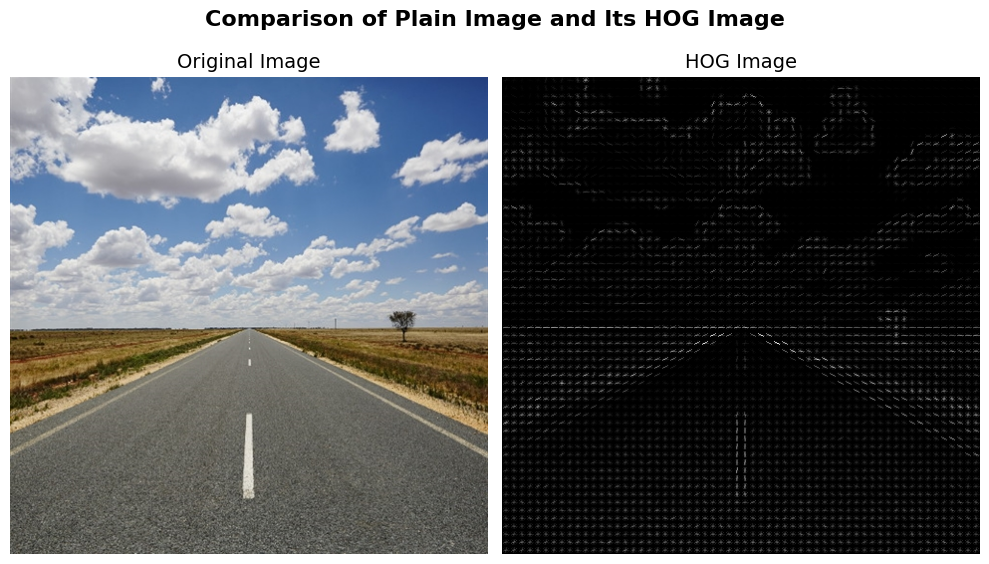

In [52]:
image_path = "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/train/Plain/2.federation-way-1.jpg"
original_image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
original_image_color = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)

hog_image = calculate_hog_image(image_path)

fig, axes = plt.subplots(1, 2, figsize=(10, 6))

axes[0].imshow(original_image_color)
axes[0].axis("off")
axes[0].set_title("Original Image", fontsize=14)


axes[1].imshow(hog_image, cmap='gray')
axes[1].axis('off')
axes[1].set_title("HOG Image", fontsize=14)

figure_title = "Comparison of Plain Image and Its HOG Image"
fig.suptitle(figure_title, fontweight="bold", fontsize=16)

fig.tight_layout()
plt.show()

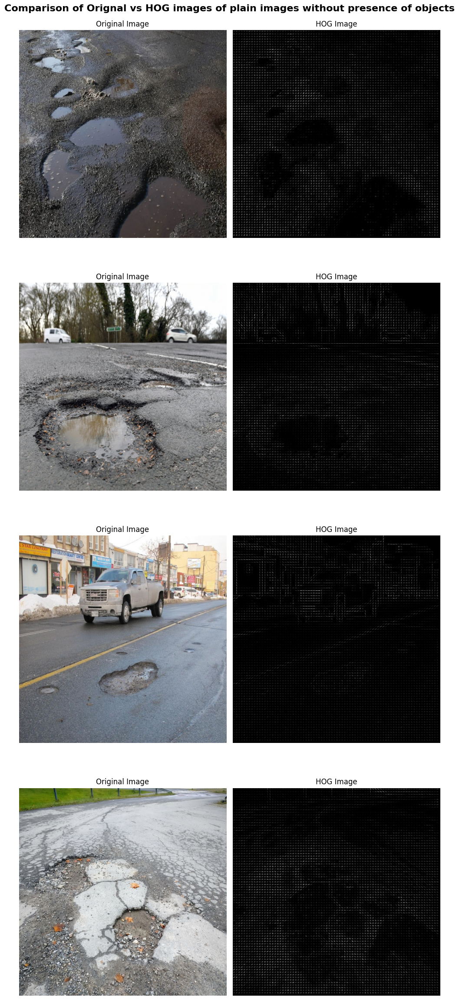

In [53]:
import matplotlib.pyplot as plt
import cv2
from skimage import feature
import numpy as np

# Define the paths to the images
image_paths = [
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/279.potholes-GEE1-930x590.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/3.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/343.pothole.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/356.Potholes_on_asphalt_road_20171023.jpg"
]

fig, axs = plt.subplots(len(image_paths), 2, figsize=(10, 6*len(image_paths)))

for i, image_path in enumerate(image_paths):
    original_image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    original_image_color = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)      
    hog_image = calculate_hog_image(image_path)

    # Subplot 1: Original Image
    axs[i, 0].imshow(original_image_color)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"Original Image", fontsize=12)

    # Subplot 2: LBP Image
    axs[i, 1].imshow(hog_image, cmap='gray')
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"HOG Image", fontsize=12)

# Set a common figure title above the subplots
figure_title = "Comparison of Orignal vs HOG images of plain images without presence of objects"
plt.suptitle(figure_title, fontsize=16, fontweight="bold")

plt.tight_layout()

plt.show()


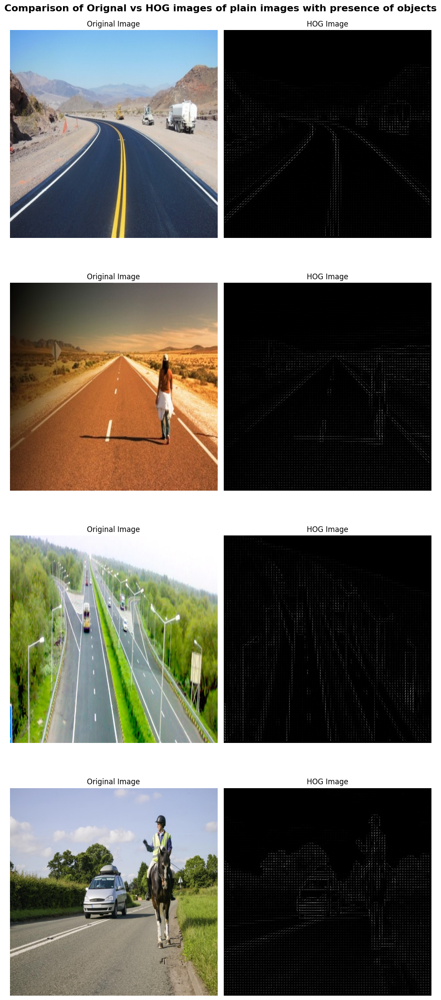

In [54]:
import matplotlib.pyplot as plt
import cv2
from skimage import feature
import numpy as np

# Define the paths to the images
image_paths = [
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/1.smooth_road_resize_md.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/116.road-to-ruin-report-cover-web-graphic-486x271.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/283.road-071112-feature.jpg",
    "/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_plain/48.Horse%20on%20country%20road.jpg"
]

fig, axs = plt.subplots(len(image_paths), 2, figsize=(10, 6*len(image_paths)))

for i, image_path in enumerate(image_paths):
    original_image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    original_image_color = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)      
    hog_image = calculate_hog_image(image_path)

    # Subplot 1: Original Image
    axs[i, 0].imshow(original_image_color)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"Original Image", fontsize=12)

    # Subplot 2: LBP Image
    axs[i, 1].imshow(hog_image, cmap='gray')
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"HOG Image", fontsize=12)

# Set a common figure title above the subplots
figure_title = "Comparison of Orignal vs HOG images of plain images with presence of objects"
plt.suptitle(figure_title, fontsize=16, fontweight="bold")

plt.tight_layout()

plt.show()


## Inference:
It can be observed that HOG features effectively capture the borders of potholes in form of gradients, whether there is/are any objects’ such as cars, are present in the image or not. In case of pothole images and in case of plain images we can see that the gradients captured are different than that or potholes and roads have uniform/no gradient.

Hence, we can conclude that HOG features will be affective for the task of pothole classification. 


### feature extraction

In [8]:
dfr["lbp"] = dfr["path"].apply(lambda x: extract_lbp_features(x))

dfr["hog"] = dfr["path"].apply(lambda x:calculate_hog_features(x))

dfr["lbp_noise_removed"] = dfr["path"].apply(lambda x: extract_lbp_features_noise(x))

dfr["hog_noise_removed"] = dfr["path"].apply(lambda x:calculate_hog_features_noise(x))

Extracting LBP and HOG features of every image and saving them as a record

# lbp padding

In [18]:
dfr = dfr[dfr['lbp'].apply(lambda x: isinstance(x, (list, np.ndarray)))]
max_length = max(len(hist) for hist in dfr['lbp'])
dfr['lbp'] = dfr['lbp'].apply(lambda x: np.pad(x, (0, max_length - len(x)), 'constant'))
#At some instances LBP values were not of consistent size, so in that case 0 padding was done

dfr = dfr[dfr['lbp_noise_removed'].apply(lambda x: isinstance(x, (list, np.ndarray)))]
max_length = max(len(hist) for hist in dfr['lbp_noise_removed'])
dfr['lbp_noise_removed'] = dfr['lbp_noise_removed'].apply(lambda x: np.pad(x, (0, max_length - len(x)), 'constant'))

In [19]:
dfr["hog"][0].shape #shape of single HOG feature vector of an image

(34596,)

In [20]:
dfr["lbp"][0].shape #shape of single LBP feature vector of an image

(10,)

### scaling of features is important as some models can be sensitive to magnitudes for example KNN , so scaling them is a good choice to bring all the feature in the same scale 

We will proceed with standard scaler, which scales the data between -1 to 1 in a way that mean of the data becomes zero and std deviation is 1.

# scaler

In [22]:
lbp_data = dfr["lbp"].to_numpy()

lbp_data = np.vstack(lbp_data)

scaler_for_lbp = StandardScaler()

scaler_for_lbp.fit(lbp_data)

dfr["lbp_scaled"] = list(scaler_for_lbp.transform(lbp_data))

with open('scaler_for_lbp.pkl', 'wb') as file:
  pickle.dump(scaler_for_lbp, file)

In [23]:
hog_data = dfr["hog"].to_numpy()

hog_data = np.vstack(hog_data)

scaler_for_hog = StandardScaler()

scaler_for_hog.fit(hog_data)

dfr["hog_scaled"] = list(scaler_for_hog.transform(hog_data))

with open('scaler_for_hog.pkl', 'wb') as file:
  pickle.dump(scaler_for_hog, file)

In [24]:
hog_noise_removed_data = dfr["hog_noise_removed"].to_numpy()

hog_noise_removed_data = np.vstack(hog_noise_removed_data)

scaler_for_hog_noise_removed = StandardScaler()

scaler_for_hog_noise_removed.fit(hog_noise_removed_data)

dfr["hog_noise_removed_scaled"] = list(scaler_for_hog_noise_removed.transform(hog_noise_removed_data))

with open('scaler_for_hog_noise_removed.pkl', 'wb') as file:
  pickle.dump(scaler_for_hog, file)

Saving the features so that there is no need to extract them everytime.

# feature dump

In [30]:
features = dfr['hog'].to_list() 

with open('hog.pkl', 'wb') as file:
    pickle.dump(features, file)
    
features = dfr['lbp'].to_list() 

with open('lbp.pkl', 'wb') as file:
    pickle.dump(features, file)

In [31]:
features = dfr['hog_noise_removed'].to_list() 

with open('hog_noise_removed.pkl', 'wb') as file:
    pickle.dump(features, file)
    
features = dfr['lbp_noise_removed'].to_list() 

with open('lbp_noise_removed.pkl', 'wb') as file:
    pickle.dump(features, file)

In [32]:
features = dfr['hog_scaled'].to_list() 

with open('hog_scaled.pkl', 'wb') as file:
    pickle.dump(features, file)
    
features = dfr['lbp_scaled'].to_list() 

with open('lbp_scaled.pkl', 'wb') as file:
    pickle.dump(features, file)

# feature loading

In [33]:
with open('./hog_scaled.pkl', 'rb') as file:
    loaded_data = pickle.load(file)
    dfr["hog_scaled"] = loaded_data

with open('./lbp_scaled.pkl', 'rb') as file:
    loaded_data = pickle.load(file)
    dfr["lbp_scaled"] = loaded_data

In [34]:
with open('./hog.pkl', 'rb') as file:
    loaded_data = pickle.load(file)
    dfr["hog"] = loaded_data

with open('./lbp.pkl', 'rb') as file:
    loaded_data = pickle.load(file)
    dfr["lbp"] = loaded_data

In [35]:
dfr

,path,class,lbp,hog,lbp_noise_removed,hog_noise_removed,lbp_scaled,hog_scaled,hog_noise_removed_scaled
0,../Dataset/Resized_Images_256/Plain/1.6.png,Plain,"[0.04182434082030612, 0.08207702636717498, 0.0...","[0.27808979635529857, 0.038086884998325535, 0....","[0.01271057128906056, 0.03163146972655768, 0.0...","[0.07937592754872747, 0.03116925418786648, 0.0...","[-1.2285643210713455, -0.10400575730781308, -0...","[0.8990834309466441, -0.5152744132546173, 0.19...","[-0.5499532713279078, -0.1383119847073563, -0...."
1,../Dataset/Resized_Images_256/Plain/1.Longests...,Plain,"[0.05737304687499125, 0.07650756835936333, 0.0...","[0.19293851184311805, 0.0, 0.01819041703219224...","[0.004089355468749376, 0.010940551757810831, 0...","[0.0, 0.0, 0.0, 0.0, 0.38157082214113536, 0.0,...","[-0.5513418756412418, -0.4845689680889458, -1....","[0.02030887046189499, -0.9899566675921063, -0....","[-1.1490356217094437, -0.5497529299312165, -0...."
2,../Dataset/Resized_Images_256/Plain/1.maxresde...,Plain,"[0.06855773925780204, 0.08374023437498723, 0.0...","[0.24698234493891583, 0.13003113823370518, 0.1...","[0.02732849121093333, 0.044342041015618235, 0....","[0.19942881269129623, 0.0961802178741715, 0.05...","[-0.06419363962527945, 0.00964188645970347, 0....","[0.5780496719982154, 0.6306398667151354, 0.311...","[0.35613459211335136, 0.7198468980104687, -0.3..."
3,../Dataset/Resized_Images_256/Plain/1.png,Plain,"[0.05259704589842948, 0.0700988769531143, 0.02...","[0.18538889078630308, 0.0, 0.09831730192859658...","[0.0025329589843746136, 0.007125854492186413, ...","[0.0, 0.0, 0.35368499310838003, 0.0, 0.3536849...","[-0.7593601537762983, -0.9224773202206603, -2....","[-0.05760439842226334, -0.9899566675921063, -0...","[-1.1490356217094437, -0.5497529299312165, 2.3..."
4,../Dataset/Resized_Images_256/Plain/1.smooth_r...,Plain,"[0.05403137207030426, 0.0746612548828011, 0.03...","[0.21455501632565765, 0.20989481911062702, 0.2...","[0.007125854492186413, 0.014282226562497821, 0...","[0.0, 0.0, 0.2634627663918566, 0.0, 0.22355557...","[-0.6968882108220003, -0.6107282790602256, -1....","[0.2433945741560424, 1.6259922584902502, 1.676...","[-1.1490356217094437, -0.5497529299312165, 1.5..."
...,...,...,...,...,...,...,...,...,...
718,../Dataset/Resized_Images_256/Pothole/95.BNG-L...,Pothole,"[0.08065795898436269, 0.0957183837890479, 0.05...","[0.23103204261133536, 0.0, 0.05851855459881382...","[0.023971557617183843, 0.039901733398431415, 0...","[0.021246821995276322, 0.0, 0.0751188595384216...","[0.4628303046593842, 0.8281134493725498, 0.208...","[0.4134400598494596, -0.9899566675921063, -0.4...","[-0.9886772302909069, -0.5497529299312165, -0...."
719,../Dataset/Resized_Images_256/Pothole/96.sei_3...,Pothole,"[0.06906127929686447, 0.08471679687498708, 0.0...","[0.2530242219577821, 0.06115578805083424, 0.05...","[0.019561767578122016, 0.04414367675780577, 0....","[0.32934776518934605, 0.0, 0.05096867720434744...","[-0.042262000077493624, 0.07637077821310728, 0...","[0.6404027868358153, -0.2277633997774258, -0.4...","[1.336685671328886, -0.5497529299312165, -0.33..."
720,../Dataset/Resized_Images_256/Pothole/97.10551...,Pothole,"[0.09257507324217337, 0.10089111328123461, 0.0...","[0.2939681830879288, 0.2037878940874826, 0.121...","[0.012298583984373125, 0.03491210937499467, 0....","[0.3148876842418638, 0.1960898366076077, 0.080...","[0.9818791072903077, 1.1815680478788617, 1.209...","[1.0629508629191828, 1.5498807850215313, 0.251...","[1.227549569890487, 2.0386756297111623, -0.074..."
721,../Dataset/Resized_Images_256/Pothole/98.5b5f7...,Pothole,"[0.08468627929686208, 0.10516357421873396, 0.0...","[0.2431088250578263, 0.08593449730763217, 0.01...","[0.007919311523436293, 0.030502319335932847, 0...","[0.2518084942701467, 0.05481406952305134, 0.02...","[0.6382834210416684, 1.4735069493000044, 0.450...","[0.538074341613781, 0.08105717113844606, -0.95...","[0.7514653141793165, 0.17380472852921378, -0.5..."


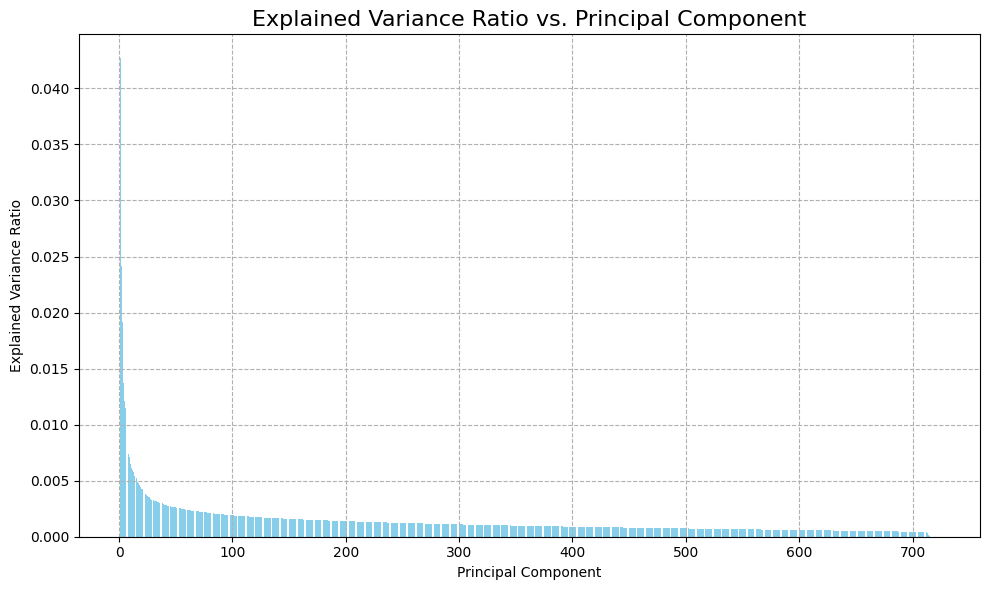

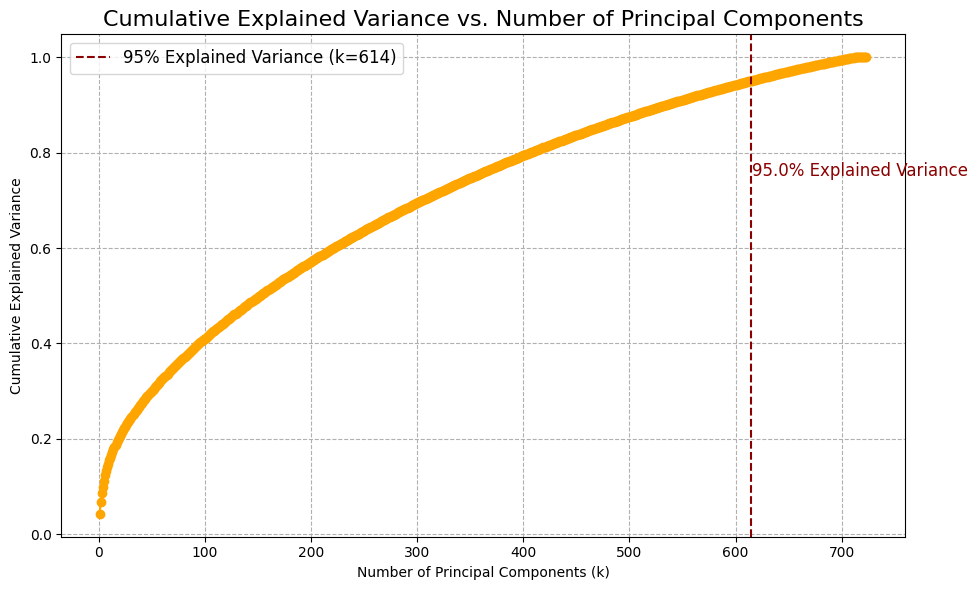

Optimal value of k: 614


In [42]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

pca = PCA()
pca.fit(np.vstack(dfr["hog_noise_removed_scaled"]))

# Desired Explained Variance
desired_explained_variance = 0.95

# Calculate the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Find the smallest k that achieves the desired explained variance
optimal_k = np.argmax(cumulative_explained_variance >= desired_explained_variance) + 1

# Plot the explained variance ratio for each principal component
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, color='skyblue')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio vs. Principal Component', fontsize=16)
plt.grid(True, linestyle='--')
plt.tight_layout()
plt.show()

# Plot the cumulative explained variance with a vertical line at 95%
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', color='orange')
plt.axvline(x=optimal_k, color='darkred', linestyle='--', label=f'95% Explained Variance (k={optimal_k})')

# Add text label next to the line
plt.text(optimal_k + 1, desired_explained_variance - 0.2, f'{desired_explained_variance*100:.1f}% Explained Variance', color='darkred', fontsize=12)

plt.xlabel('Number of Principal Components (k)')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs. Number of Principal Components', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--')
plt.tight_layout()
plt.show()


print(f"Optimal value of k: {optimal_k}")


In [43]:
from sklearn.decomposition import PCA
import numpy as np

n_components = 617
pca = PCA(n_components=n_components)

hog_features_array = np.array(dfr["hog_scaled"].tolist())

hog_features_pca = pca.fit_transform(hog_features_array)

with open("pca.pkl","wb") as file:
    pickle.dump(pca,file)

dfr["hog_features_pca"] = list(hog_features_pca)


In [44]:
from sklearn.decomposition import PCA
import numpy as np

n_components = 614
pcan = PCA(n_components=n_components)

hog_features_array = np.array(dfr["hog_noise_removed_scaled"].tolist())

hog_features_pca = pca.fit_transform(hog_features_array)

with open("pca.pkl","wb") as file:
    pickle.dump(pcan,file)

dfr["hog_features_pca_noise_removed"] = list(hog_features_pca)


In [47]:
dfr

,path,class,lbp,hog,lbp_noise_removed,hog_noise_removed,lbp_scaled,hog_scaled,hog_noise_removed_scaled,hog_features_pca,hog_features_pca_noise_removed
0,../Dataset/Resized_Images_256/Plain/1.6.png,Plain,"[0.04182434082030612, 0.08207702636717498, 0.0...","[0.27808979635529857, 0.038086884998325535, 0....","[0.01271057128906056, 0.03163146972655768, 0.0...","[0.07937592754872747, 0.03116925418786648, 0.0...","[-1.2285643210713455, -0.10400575730781308, -0...","[0.8990834309466441, -0.5152744132546173, 0.19...","[-0.5499532713279078, -0.1383119847073563, -0....","[-41.58013755871838, 31.409654742651163, 3.208...","[-8.712509731255418, 40.97825410306562, -0.113..."
1,../Dataset/Resized_Images_256/Plain/1.Longests...,Plain,"[0.05737304687499125, 0.07650756835936333, 0.0...","[0.19293851184311805, 0.0, 0.01819041703219224...","[0.004089355468749376, 0.010940551757810831, 0...","[0.0, 0.0, 0.0, 0.0, 0.38157082214113536, 0.0,...","[-0.5513418756412418, -0.4845689680889458, -1....","[0.02030887046189499, -0.9899566675921063, -0....","[-1.1490356217094437, -0.5497529299312165, -0....","[38.852921296077525, 17.3689952800125, 2.75350...","[57.891751240366744, 16.92471976998381, -14.93..."
2,../Dataset/Resized_Images_256/Plain/1.maxresde...,Plain,"[0.06855773925780204, 0.08374023437498723, 0.0...","[0.24698234493891583, 0.13003113823370518, 0.1...","[0.02732849121093333, 0.044342041015618235, 0....","[0.19942881269129623, 0.0961802178741715, 0.05...","[-0.06419363962527945, 0.00964188645970347, 0....","[0.5780496719982154, 0.6306398667151354, 0.311...","[0.35613459211335136, 0.7198468980104687, -0.3...","[-16.451786850848407, 2.148873318650893, 14.71...","[-18.18932527464402, 25.669968349087092, 7.990..."
3,../Dataset/Resized_Images_256/Plain/1.png,Plain,"[0.05259704589842948, 0.0700988769531143, 0.02...","[0.18538889078630308, 0.0, 0.09831730192859658...","[0.0025329589843746136, 0.007125854492186413, ...","[0.0, 0.0, 0.35368499310838003, 0.0, 0.3536849...","[-0.7593601537762983, -0.9224773202206603, -2....","[-0.05760439842226334, -0.9899566675921063, -0...","[-1.1490356217094437, -0.5497529299312165, 2.3...","[101.91088523086552, 12.304699393274605, 21.78...","[111.31126300562863, -4.0642558987761594, -4.5..."
4,../Dataset/Resized_Images_256/Plain/1.smooth_r...,Plain,"[0.05403137207030426, 0.0746612548828011, 0.03...","[0.21455501632565765, 0.20989481911062702, 0.2...","[0.007125854492186413, 0.014282226562497821, 0...","[0.0, 0.0, 0.2634627663918566, 0.0, 0.22355557...","[-0.6968882108220003, -0.6107282790602256, -1....","[0.2433945741560424, 1.6259922584902502, 1.676...","[-1.1490356217094437, -0.5497529299312165, 1.5...","[46.81934284318626, 64.24117242671699, -17.987...","[75.98211534971138, 31.66494257854501, -27.696..."
...,...,...,...,...,...,...,...,...,...,...,...
718,../Dataset/Resized_Images_256/Pothole/95.BNG-L...,Pothole,"[0.08065795898436269, 0.0957183837890479, 0.05...","[0.23103204261133536, 0.0, 0.05851855459881382...","[0.023971557617183843, 0.039901733398431415, 0...","[0.021246821995276322, 0.0, 0.0751188595384216...","[0.4628303046593842, 0.8281134493725498, 0.208...","[0.4134400598494596, -0.9899566675921063, -0.4...","[-0.9886772302909069, -0.5497529299312165, -0....","[30.73043915952452, 3.2893341081461247, -27.18...","[17.017774381011424, -25.979991535831743, -14...."
719,../Dataset/Resized_Images_256/Pothole/96.sei_3...,Pothole,"[0.06906127929686447, 0.08471679687498708, 0.0...","[0.2530242219577821, 0.06115578805083424, 0.05...","[0.019561767578122016, 0.04414367675780577, 0....","[0.32934776518934605, 0.0, 0.05096867720434744...","[-0.042262000077493624, 0.07637077821310728, 0...","[0.6404027868358153, -0.2277633997774258, -0.4...","[1.336685671328886, -0.5497529299312165, -0.33...","[10.433047946293408, -2.027288919132124, -15.1...","[-6.430656004672527, -50.7417355408318, -6.666..."
720,../Dataset/Resized_Images_256/Pothole/97.10551...,Pothole,"[0.09257507324217337, 0.10089111328123461, 0.0...","[0.2939681

In [ ]:
lengths = np.array()

function for padding the lbp features since they are not of same lenght

In [70]:
def pad_lbp_features(test_lbp, max_length=10):
    """
    Pad LBP features of a test image to a maximum length.
    
    Parameters:
    - test_lbp: LBP features of a test image (list or numpy array).
    - max_length: The maximum length for padding.

    Returns:
    - Padded LBP features.
    """
    if isinstance(test_lbp, (list, np.ndarray)):
        if len(test_lbp) < max_length:
            pad_width = max_length - len(test_lbp)
            padded_lbp = np.pad(test_lbp, (0, pad_width), 'constant')
            return padded_lbp
        else:
            return test_lbp
    else:
        raise ValueError("Input 'test_lbp' must be a list or numpy array.")

In [49]:
label_encoder = LabelEncoder()
dfr['class'] = label_encoder.fit_transform(dfr['class'])
dfr

,path,class,lbp,hog,lbp_noise_removed,hog_noise_removed,lbp_scaled,hog_scaled,hog_noise_removed_scaled,hog_features_pca,hog_features_pca_noise_removed
0,../Dataset/Resized_Images_256/Plain/1.6.png,0,"[0.04182434082030612, 0.08207702636717498, 0.0...","[0.27808979635529857, 0.038086884998325535, 0....","[0.01271057128906056, 0.03163146972655768, 0.0...","[0.07937592754872747, 0.03116925418786648, 0.0...","[-1.2285643210713455, -0.10400575730781308, -0...","[0.8990834309466441, -0.5152744132546173, 0.19...","[-0.5499532713279078, -0.1383119847073563, -0....","[-41.58013755871838, 31.409654742651163, 3.208...","[-8.712509731255418, 40.97825410306562, -0.113..."
1,../Dataset/Resized_Images_256/Plain/1.Longests...,0,"[0.05737304687499125, 0.07650756835936333, 0.0...","[0.19293851184311805, 0.0, 0.01819041703219224...","[0.004089355468749376, 0.010940551757810831, 0...","[0.0, 0.0, 0.0, 0.0, 0.38157082214113536, 0.0,...","[-0.5513418756412418, -0.4845689680889458, -1....","[0.02030887046189499, -0.9899566675921063, -0....","[-1.1490356217094437, -0.5497529299312165, -0....","[38.852921296077525, 17.3689952800125, 2.75350...","[57.891751240366744, 16.92471976998381, -14.93..."
2,../Dataset/Resized_Images_256/Plain/1.maxresde...,0,"[0.06855773925780204, 0.08374023437498723, 0.0...","[0.24698234493891583, 0.13003113823370518, 0.1...","[0.02732849121093333, 0.044342041015618235, 0....","[0.19942881269129623, 0.0961802178741715, 0.05...","[-0.06419363962527945, 0.00964188645970347, 0....","[0.5780496719982154, 0.6306398667151354, 0.311...","[0.35613459211335136, 0.7198468980104687, -0.3...","[-16.451786850848407, 2.148873318650893, 14.71...","[-18.18932527464402, 25.669968349087092, 7.990..."
3,../Dataset/Resized_Images_256/Plain/1.png,0,"[0.05259704589842948, 0.0700988769531143, 0.02...","[0.18538889078630308, 0.0, 0.09831730192859658...","[0.0025329589843746136, 0.007125854492186413, ...","[0.0, 0.0, 0.35368499310838003, 0.0, 0.3536849...","[-0.7593601537762983, -0.9224773202206603, -2....","[-0.05760439842226334, -0.9899566675921063, -0...","[-1.1490356217094437, -0.5497529299312165, 2.3...","[101.91088523086552, 12.304699393274605, 21.78...","[111.31126300562863, -4.0642558987761594, -4.5..."
4,../Dataset/Resized_Images_256/Plain/1.smooth_r...,0,"[0.05403137207030426, 0.0746612548828011, 0.03...","[0.21455501632565765, 0.20989481911062702, 0.2...","[0.007125854492186413, 0.014282226562497821, 0...","[0.0, 0.0, 0.2634627663918566, 0.0, 0.22355557...","[-0.6968882108220003, -0.6107282790602256, -1....","[0.2433945741560424, 1.6259922584902502, 1.676...","[-1.1490356217094437, -0.5497529299312165, 1.5...","[46.81934284318626, 64.24117242671699, -17.987...","[75.98211534971138, 31.66494257854501, -27.696..."
...,...,...,...,...,...,...,...,...,...,...,...
718,../Dataset/Resized_Images_256/Pothole/95.BNG-L...,1,"[0.08065795898436269, 0.0957183837890479, 0.05...","[0.23103204261133536, 0.0, 0.05851855459881382...","[0.023971557617183843, 0.039901733398431415, 0...","[0.021246821995276322, 0.0, 0.0751188595384216...","[0.4628303046593842, 0.8281134493725498, 0.208...","[0.4134400598494596, -0.9899566675921063, -0.4...","[-0.9886772302909069, -0.5497529299312165, -0....","[30.73043915952452, 3.2893341081461247, -27.18...","[17.017774381011424, -25.979991535831743, -14...."
719,../Dataset/Resized_Images_256/Pothole/96.sei_3...,1,"[0.06906127929686447, 0.08471679687498708, 0.0...","[0.2530242219577821, 0.06115578805083424, 0.05...","[0.019561767578122016, 0.04414367675780577, 0....","[0.32934776518934605, 0.0, 0.05096867720434744...","[-0.042262000077493624, 0.07637077821310728, 0...","[0.6404027868358153, -0.2277633997774258, -0.4...","[1.336685671328886, -0.5497529299312165, -0.33...","[10.433047946293408, -2.027288919132124, -15.1...","[-6.430656004672527, -50.7417355408318, -6.666..."
720,../Dataset/Resized_Images_256/Pothole/97.10551...,1,"[0.09257507324217337, 0.10089111328123461, 0.0...","[0.2939681830879288, 0.2037878940874826, 0.121..

In [50]:
dfr.isna().sum()

path                              0
class                             0
lbp                               0
hog                               0
lbp_noise_removed                 0
hog_noise_removed                 0
lbp_scaled                        0
hog_scaled                        0
hog_noise_removed_scaled          0
hog_features_pca                  0
hog_features_pca_noise_removed    0
dtype: int64

In [51]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_curve, auc

# kNN classifier

In [52]:
from sklearn.neighbors import KNeighborsClassifier

## hog

In [56]:
X = np.vstack(dfr['hog_features_pca'].values)
y = dfr['class']  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



param_grid = {
    'n_neighbors': list(range(1, 100, 1)),   
    'p': [1, 2]  # Distance metric (1 for Manhattan, 2 for Euclidean)
}

knn_classifier_hog = KNeighborsClassifier()


grid_search = GridSearchCV(estimator=knn_classifier_hog, param_grid=param_grid, cv=5, scoring='accuracy')


grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_


best_knn_classifier_hog = KNeighborsClassifier(**best_params)
best_knn_classifier_hog.fit(X_train, y_train)


y_pred = best_knn_classifier_hog.predict(X_test)



accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)


Accuracy: 0.4896551724137931
Precision: 0.4666666666666667
Recall: 0.9692307692307692
F1-Score: 0.63
Jaccard's Index: 0.45985401459854014
Confusion Matrix:
[[ 8 72]
 [ 2 63]]
True Positive Rate (TPR): 0.9692307692307692
False Positive Rate (FPR): 0.9
ROC-AUC: 0.5346153846153846


In [57]:
X = np.vstack(dfr['hog_features_pca_noise_removed'].values)
y = dfr['class']  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



param_grid = {
    'n_neighbors': list(range(1, 100, 1)),   
    'p': [1, 2]  # Distance metric (1 for Manhattan, 2 for Euclidean)
}

knn_classifier_hog = KNeighborsClassifier()


grid_search = GridSearchCV(estimator=knn_classifier_hog, param_grid=param_grid, cv=5, scoring='accuracy')


grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_


best_knn_classifier_hog = KNeighborsClassifier(**best_params)
best_knn_classifier_hog.fit(X_train, y_train)


y_pred = best_knn_classifier_hog.predict(X_test)



accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)


Accuracy: 0.5586206896551724
Precision: 0.5045871559633027
Recall: 0.8461538461538461
F1-Score: 0.632183908045977
Jaccard's Index: 0.46218487394957986
Confusion Matrix:
[[26 54]
 [10 55]]
True Positive Rate (TPR): 0.8461538461538461
False Positive Rate (FPR): 0.675
ROC-AUC: 0.5855769230769231


In [76]:
with open('knn_hog.pkl', 'wb') as file:
    pickle.dump(best_knn_classifier_hog, file)

## lbp

In [58]:
X = np.vstack(dfr['lbp'].values)
y = dfr['class']  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'n_neighbors': list(range(1, 100, 1)),   
    'p': [1, 2]  # Distance metric (1 for Manhattan, 2 for Euclidean)
}
knn_classifier_lbp = KNeighborsClassifier()

grid_search = GridSearchCV(estimator=knn_classifier_lbp, param_grid=param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_knn_classifier_lbp = KNeighborsClassifier(**best_params)

best_knn_classifier_lbp.fit(X_train, y_train)

y_pred = best_knn_classifier_lbp.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)

print(f"Best Parameters: {best_params}")

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)


Best Parameters: {'n_neighbors': 5, 'p': 2}
Accuracy: 0.8068965517241379
Precision: 0.7466666666666667
Recall: 0.8615384615384616
F1-Score: 0.8
Jaccard's Index: 0.6666666666666666


In [78]:
with open('knn_lbp.pkl', 'wb') as file:
    pickle.dump(best_knn_classifier_lbp, file)

In [59]:
X = np.vstack(dfr['lbp_noise_removed'].values)
y = dfr['class']  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'n_neighbors': list(range(1, 100, 1)),   
    'p': [1, 2]  # Distance metric (1 for Manhattan, 2 for Euclidean)
}
knn_classifier_lbp = KNeighborsClassifier()

grid_search = GridSearchCV(estimator=knn_classifier_lbp, param_grid=param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_knn_classifier_lbp = KNeighborsClassifier(**best_params)

best_knn_classifier_lbp.fit(X_train, y_train)

y_pred = best_knn_classifier_lbp.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)

print(f"Best Parameters: {best_params}")

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)


Best Parameters: {'n_neighbors': 10, 'p': 1}
Accuracy: 0.7034482758620689
Precision: 0.6410256410256411
Recall: 0.7692307692307693
F1-Score: 0.6993006993006994
Jaccard's Index: 0.5376344086021505


In [81]:
X_hog= np.vstack(dfr['hog_features_pca_noise_removed'].values)
X_lbp = np.vstack(dfr['lbp'].values)
X = np.hstack([X_hog,X_lbp])
y = dfr['class']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21],   
    'p': [1, 2]  # Distance metric (1 for Manhattan, 2 for Euclidean)
}

knn_classifier_combined = KNeighborsClassifier()


grid_search = GridSearchCV(estimator=knn_classifier_combined, param_grid=param_grid, cv=5, scoring='accuracy')


grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_


best_knn_classifier_combined = KNeighborsClassifier(**best_params)
best_knn_classifier_combined.fit(X_train, y_train)


y_pred = best_knn_classifier_combined.predict(X_test)



accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)

Accuracy: 0.5586206896551724
Precision: 0.5045871559633027
Recall: 0.8461538461538461
F1-Score: 0.632183908045977
Jaccard's Index: 0.46218487394957986
Confusion Matrix:
[[26 54]
 [10 55]]
True Positive Rate (TPR): 0.8461538461538461
False Positive Rate (FPR): 0.675
ROC-AUC: 0.5855769230769231


In [81]:
with open('knn_combined.pkl', 'wb') as file:
    pickle.dump(best_knn_classifier_combined, file)

# SVM

In [82]:
from sklearn.svm import SVC

## hog

In [83]:
X = np.vstack(dfr['hog_features_pca'].values) 
y = dfr['class']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



best_params ={'C': 0.01, 'kernel': 'linear'}

best_svm_classifier_hog = SVC(**best_params)

best_svm_classifier_hog.fit(X_train, y_train)

y_pred = best_svm_classifier_hog.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Best Parameters: {best_params}")
print(f"Accuracy: {accuracy:.2f}")
print(report)


accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)



Best Parameters: {'C': 0.01, 'kernel': 'linear'}
Accuracy: 0.91
              precision    recall  f1-score   support

           0       0.96      0.88      0.92        82
           1       0.85      0.95      0.89        58

    accuracy                           0.91       140
   macro avg       0.90      0.91      0.91       140
weighted avg       0.91      0.91      0.91       140

Accuracy: 0.9071428571428571
Precision: 0.8461538461538461
Recall: 0.9482758620689655
F1-Score: 0.894308943089431
Jaccard's Index: 0.8088235294117647
Confusion Matrix:
[[72 10]
 [ 3 55]]
True Positive Rate (TPR): 0.9482758620689655
False Positive Rate (FPR): 0.12195121951219512
ROC-AUC: 0.9131623212783851


In [84]:
X = np.vstack(dfr['hog_features_pca_noise_removed'].values) 
y = dfr['class']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



best_params ={'C': 0.01, 'kernel': 'linear'}

best_svm_classifier_hog = SVC(**best_params)

best_svm_classifier_hog.fit(X_train, y_train)

y_pred = best_svm_classifier_hog.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Best Parameters: {best_params}")
print(f"Accuracy: {accuracy:.2f}")
print(report)


accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)



Best Parameters: {'C': 0.01, 'kernel': 'linear'}
Accuracy: 0.93
              precision    recall  f1-score   support

           0       0.96      0.91      0.94        82
           1       0.89      0.95      0.92        58

    accuracy                           0.93       140
   macro avg       0.92      0.93      0.93       140
weighted avg       0.93      0.93      0.93       140

Accuracy: 0.9285714285714286
Precision: 0.8870967741935484
Recall: 0.9482758620689655
F1-Score: 0.9166666666666667
Jaccard's Index: 0.8461538461538461
Confusion Matrix:
[[75  7]
 [ 3 55]]
True Positive Rate (TPR): 0.9482758620689655
False Positive Rate (FPR): 0.08536585365853659
ROC-AUC: 0.9314550042052145


In [85]:
with open('svm_hog.pkl', 'wb') as file:
    pickle.dump(best_svm_classifier_hog, file)

## lbp

In [105]:
X = np.vstack(dfr['lbp'].values) 
y = dfr['class'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'C': [0.01, 0.1, 1.0, 10.0], 
    'kernel': ['linear', 'rbf'], 
}
svm_classifier = SVC()

grid_search = GridSearchCV(estimator=svm_classifier, param_grid=param_grid, cv=5)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_svm_classifier_lbp = SVC(**best_params)

best_svm_classifier_lbp.fit(X_train, y_train)

y_pred = best_svm_classifier_lbp.predict(X_test)



accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)




Accuracy: 0.8428571428571429
Precision: 0.7903225806451613
Recall: 0.8448275862068966
F1-Score: 0.8166666666666667
Jaccard's Index: 0.6901408450704225
Confusion Matrix:
[[69 13]
 [ 9 49]]
True Positive Rate (TPR): 0.8448275862068966
False Positive Rate (FPR): 0.15853658536585366
ROC-AUC: 0.8431455004205214


In [87]:
with open('svm_lbp.pkl', 'wb') as file:
    pickle.dump(best_svm_classifier_lbp, file)

In [106]:
X = np.vstack(dfr['lbp_noise_removed'].values) 
y = dfr['class'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'C': [0.01, 0.1, 1.0, 10.0], 
    'kernel': ['linear', 'rbf'], 
}
svm_classifier = SVC()

grid_search = GridSearchCV(estimator=svm_classifier, param_grid=param_grid, cv=5)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_svm_classifier_lbp = SVC(**best_params)

best_svm_classifier_lbp.fit(X_train, y_train)

y_pred = best_svm_classifier_lbp.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)



Accuracy: 0.7714285714285715
Precision: 0.6756756756756757
Recall: 0.8620689655172413
F1-Score: 0.7575757575757576
Jaccard's Index: 0.6097560975609756
Confusion Matrix:
[[58 24]
 [ 8 50]]
True Positive Rate (TPR): 0.8620689655172413
False Positive Rate (FPR): 0.2926829268292683
ROC-AUC: 0.7846930193439865


In [107]:
X_hog = np.vstack(dfr['hog_features_pca_noise_removed'].values)
X_lbp = np.vstack(dfr['lbp'].values)
X = np.hstack([X_hog,X_lbp])
y = dfr['class']  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

best_params ={'C': 0.01, 'kernel': 'linear'}

best_svm_classifier_combined = SVC(C=0.01,kernel='linear')

best_svm_classifier_combined.fit(X_train, y_train)

y_pred = best_svm_classifier_combined.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)

Accuracy: 0.9285714285714286
Precision: 0.8870967741935484
Recall: 0.9482758620689655
F1-Score: 0.9166666666666667
Jaccard's Index: 0.8461538461538461
Confusion Matrix:
[[75  7]
 [ 3 55]]
True Positive Rate (TPR): 0.9482758620689655
False Positive Rate (FPR): 0.08536585365853659
ROC-AUC: 0.9314550042052145


In [90]:
with open('svm_combined.pkl', 'wb') as file:
    pickle.dump(best_svm_classifier_combined, file)

# RF

In [91]:
from sklearn.ensemble import RandomForestClassifier

## hog

In [108]:
warnings.filterwarnings("ignore")

X = np.vstack(dfr['hog_features_pca'].values)
y = dfr['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],          # Number of trees
    'max_depth': [None, 10, 20, 30],        # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],        # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],          # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2']  # Number of features to consider for the best split
}

rf_classifier = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_accuracy = grid_search.best_score_

best_rf_classifier_hog = RandomForestClassifier(**best_params)

best_rf_classifier_hog.fit(X_train, y_train)

y_pred = best_rf_classifier_hog.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)


Accuracy: 0.8785714285714286
Precision: 0.847457627118644
Recall: 0.8620689655172413
F1-Score: 0.8547008547008546
Jaccard's Index: 0.746268656716418
Confusion Matrix:
[[73  9]
 [ 8 50]]
True Positive Rate (TPR): 0.8620689655172413
False Positive Rate (FPR): 0.10975609756097561
ROC-AUC: 0.8761564339781328


In [109]:
warnings.filterwarnings("ignore")

X = np.vstack(dfr['hog_features_pca_noise_removed'].values)
y = dfr['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],          # Number of trees
    'max_depth': [None, 10, 20, 30],        # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],        # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],          # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2']  # Number of features to consider for the best split
}

rf_classifier = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_accuracy = grid_search.best_score_

best_rf_classifier_hog = RandomForestClassifier(**best_params)

best_rf_classifier_hog.fit(X_train, y_train)

y_pred = best_rf_classifier_hog.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)

Accuracy: 0.9428571428571428
Precision: 0.9032258064516129
Recall: 0.9655172413793104
F1-Score: 0.9333333333333333
Jaccard's Index: 0.875
Confusion Matrix:
[[76  6]
 [ 2 56]]
True Positive Rate (TPR): 0.9655172413793104
False Positive Rate (FPR): 0.07317073170731707
ROC-AUC: 0.9461732548359967


In [94]:
with open('rf_hog.pkl', 'wb') as file:
    pickle.dump(best_rf_classifier_hog, file)

## lbp

In [110]:
warnings.filterwarnings("ignore")

X = np.vstack(dfr['lbp'].values)
y = dfr['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],          # Number of trees
    'max_depth': [None, 10, 20, 30],        # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],        # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],          # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2']  # Number of features to consider for the best split
}

rf_classifier = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_accuracy = grid_search.best_score_

best_rf_classifier_lbp = RandomForestClassifier(**best_params)

best_rf_classifier_lbp.fit(X_train, y_train)

y_pred = best_rf_classifier_lbp.predict(X_test)



accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)


Accuracy: 0.8571428571428571
Precision: 0.7878787878787878
Recall: 0.896551724137931
F1-Score: 0.8387096774193549
Jaccard's Index: 0.7222222222222222
Confusion Matrix:
[[68 14]
 [ 6 52]]
True Positive Rate (TPR): 0.896551724137931
False Positive Rate (FPR): 0.17073170731707318
ROC-AUC: 0.8629100084104289


In [96]:
with open('rf_lbp.pkl', 'wb') as file:
    pickle.dump(best_rf_classifier_lbp, file)

In [111]:
warnings.filterwarnings("ignore")

X = np.vstack(dfr['lbp_noise_removed'].values)
y = dfr['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],          # Number of trees
    'max_depth': [None, 10, 20, 30],        # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],        # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],          # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2']  # Number of features to consider for the best split
}

rf_classifier = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_accuracy = grid_search.best_score_

best_rf_classifier_lbp = RandomForestClassifier(**best_params)

best_rf_classifier_lbp.fit(X_train, y_train)

y_pred = best_rf_classifier_lbp.predict(X_test)



accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)


Accuracy: 0.7714285714285715
Precision: 0.696969696969697
Recall: 0.7931034482758621
F1-Score: 0.7419354838709677
Jaccard's Index: 0.5897435897435898
Confusion Matrix:
[[62 20]
 [12 46]]
True Positive Rate (TPR): 0.7931034482758621
False Positive Rate (FPR): 0.24390243902439024
ROC-AUC: 0.7746005046257359


In [112]:
warnings.filterwarnings("ignore")

X_hog = np.vstack(dfr['hog_features_pca'].values)
X_lbp = np.vstack(dfr['lbp'].values)
X = np.hstack([X_hog,X_lbp])
y = dfr['class']  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],          # Number of trees
    'max_depth': [None, 10, 20, 30],        # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],        # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],          # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2']  # Number of features to consider for the best split
}

rf_classifier = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_accuracy = grid_search.best_score_

best_rf_classifier_combined = RandomForestClassifier(**best_params)

best_rf_classifier_combined.fit(X_train, y_train)

y_pred = best_rf_classifier_combined.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


precision = precision_score(y_test, y_pred)
print("Precision:", precision)


recall = recall_score(y_test, y_pred)
print("Recall:", recall)


f1 = f1_score(y_test, y_pred)
print("F1-Score:", f1)

# Jaccard's Index
jaccard = jaccard_score(y_test, y_pred)
print("Jaccard's Index:", jaccard)

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() ##ravel flattens
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("True Positive Rate (TPR):", tpr)
print("False Positive Rate (FPR):", fpr)

roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc)


Accuracy: 0.8785714285714286
Precision: 0.8360655737704918
Recall: 0.8793103448275862
F1-Score: 0.8571428571428572
Jaccard's Index: 0.75
Confusion Matrix:
[[72 10]
 [ 7 51]]
True Positive Rate (TPR): 0.8793103448275862
False Positive Rate (FPR): 0.12195121951219512
ROC-AUC: 0.8786795626576955


In [99]:
with open('rf_combined.pkl', 'wb') as file:
    pickle.dump(best_rf_classifier_combined, file)

# pipline functions

In [1]:
import cv2
import numpy as np
from skimage.feature import hog, local_binary_pattern
import pickle
def resize_image(image_array):
    if image_array is not None:
        image_array = cv2.resize(image_array, (645, 645), interpolation=cv2.INTER_AREA)
        return image_array
    else:
        print(f"Failed to read image")
def convert_image_to_grayscale(image_array):
    return cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)

def convert_image_to_grayscale_n(image_array):
    image_array = cv2.fastNlMeansDenoisingColored(image_array, None, 10, 10, 7, 21)
    return cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)

def extract_hog_features(image_array):
    grayscale_image = convert_image_to_grayscale_n(image_array)
    features, _ = hog(
        grayscale_image,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        block_norm='L2-Hys',
        visualize=True
    )
    return features

def pad_lbp_features(test_lbp, max_length=10):
    if isinstance(test_lbp, (list, np.ndarray)):
        if len(test_lbp) < max_length:
            pad_width = max_length - len(test_lbp)
            padded_lbp = np.pad(test_lbp, (0, pad_width), 'constant')
            return padded_lbp
        else:
            return test_lbp
    else:
        raise ValueError("Input 'test_lbp' must be a list or numpy array.")

def extract_lbp_features(image_array, radius=1, n_points=8):
    image_array = convert_image_to_grayscale(image_array)
    lbp_image = local_binary_pattern(image_array, n_points, radius, method='uniform')
    lbp_hist, _ = np.histogram(lbp_image.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    lbp_hist = lbp_hist.astype("float")
    lbp_hist /= (lbp_hist.sum() + 1e-8)
    lbp_hist = pad_lbp_features(lbp_hist)
    return lbp_hist

def pca_hog(hog_feature):
    with open("/Users/harshkotadiya/CodeSpace/pca.pkl", "rb") as file:
        pca = pickle.load(file)
    hog_feature = pca.transform([hog_feature])[0]
    return hog_feature

def extract_features_from_image(image_array, radius=1, n_points=8):
    image_array = resize_image(image_array)
    hog_features = extract_hog_features(image_array)
    hog_features_pca = pca_hog(hog_features)
    lbp_features = extract_lbp_features(image_array, radius, n_points)
    return hog_features, lbp_features ,hog_features_pca
def predict_class(image_array):
    hog_features, lbp_features, hog_features_pca = extract_features_from_image(image_array)
    
    model_paths = [
        
        ("/Users/harshkotadiya/CodeSpace/svm_combined.pkl", "svm_combined"),
        ("/Users/harshkotadiya/CodeSpace/rf_combined.pkl", "rf_combined"),
        ("/Users/harshkotadiya/CodeSpace/knn_combined.pkl", "knn_combined"),
        ("/Users/harshkotadiya/CodeSpace/svm_hog.pkl", "svm_hog"),
        ("/Users/harshkotadiya/CodeSpace/rf_hog.pkl", "rf_hog"),
        ("/Users/harshkotadiya/CodeSpace/knn_hog.pkl", "knn_hog"),
        ("/Users/harshkotadiya/CodeSpace/svm_lbp.pkl", "svm_lbp"),
        ("/Users/harshkotadiya/CodeSpace/rf_lbp.pkl", "rf_lbp"),
        ("/Users/harshkotadiya/CodeSpace/knn_lbp.pkl", "knn_lbp")
    ]

    results = {}

    for model_path, feature_type in model_paths:
        with open(model_path, 'rb') as file:
            Model = pickle.load(file)
        
        if "hog" in feature_type:
            features = hog_features_pca
        elif "lbp" in feature_type:
            features = lbp_features
        elif "combined" in feature_type:
            features = np.concatenate((hog_features_pca, lbp_features))
        else:
            continue 

        predicted_class = Model.predict([features])
        results[feature_type] = predicted_class[0]

    return results

# Example usage:
image_array = cv2.imread("/Users/harshkotadiya/CodeSpace/PROJECTS/EDA_DPL/My Dataset/resized_pothole/1.jpg")
results = predict_class(image_array)
print("Predicted classes:", results)




/Users/harshkotadiya/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Predicted classes: {'svm_combined': 0, 'rf_combined': 1, 'knn_combined': 1, 'svm_hog': 0, 'rf_hog': 1, 'knn_hog': 1, 'svm_lbp': 1, 'rf_lbp': 1, 'knn_lbp': 1}


In [8]:
results = {
    "KNN": {
        "h": {
            "Accuracy": 0.8285714285714286,
            "Precision": 0.717948717948718,
            "Recall": 0.9655172413793104,
            "F1-Score": 0.8235294117647058,
            "Jaccard's Index": 0.7,
        },
        "hn": {
            "Accuracy": 0.9071428571428571,
            "Precision": 0.8260869565217391,
            "Recall": 0.9827586206896551,
            "F1-Score": 0.8976377952755905,
            "Jaccard's Index": 0.8142857142857143,
        },
        "l": {
            "Accuracy": 0.8,
            "Precision": 0.7083333333333334,
            "Recall": 0.8793103448275862,
            "F1-Score": 0.7846153846153847,
            "Jaccard's Index": 0.6455696202531646,
        },
        "ln": {
            "Accuracy": 0.7785714285714286,
            "Precision": 0.6956521739130435,
            "Recall": 0.8275862068965517,
            "F1-Score": 0.7559055118110236,
            "Jaccard's Index": 0.6075949367088608,
        },
        "hl": {
            "Accuracy": 0.9071428571428571,
            "Precision": 0.8260869565217391,
            "Recall": 0.9827586206896551,
            "F1-Score": 0.8976377952755905,
            "Jaccard's Index": 0.8142857142857143,
        },
    },
    "SVM": {
        "h": {
            "Accuracy": 0.9071428571428571,
            "Precision": 0.8461538461538461,
            "Recall": 0.9482758620689655,
            "F1-Score": 0.894308943089431,
            "Jaccard's Index": 0.8088235294117647,
        },
        "hn": {
            "Accuracy": 0.9285714285714286,
            "Precision": 0.8870967741935484,
            "Recall": 0.9482758620689655,
            "F1-Score": 0.9166666666666667,
            "Jaccard's Index": 0.8461538461538461,
        },
        "l": {
            "Accuracy": 0.8428571428571429,
            "Precision": 0.7903225806451613,
            "Recall": 0.8448275862068966,
            "F1-Score": 0.8166666666666667,
            "Jaccard's Index": 0.6901408450704225,
        },
        "ln": {
            "Accuracy": 0.7714285714285715,
            "Precision": 0.6756756756756757,
            "Recall": 0.8620689655172413,
            "F1-Score": 0.7575757575757576,
            "Jaccard's Index": 0.6097560975609756,
        },
        "hl": {
            "Accuracy": 0.9285714285714286,
            "Precision": 0.8870967741935484,
            "Recall": 0.9482758620689655,
            "F1-Score": 0.9166666666666667,
            "Jaccard's Index": 0.8461538461538461,
        },
    },
    "Random Forest": {
        "h": {
            "Accuracy": 0.8785714285714286,
            "Precision": 0.847457627118644,
            "Recall": 0.8620689655172413,
            "F1-Score": 0.8547008547008546,
            "Jaccard's Index": 0.746268656716418,
        },
        "hn": {
            "Accuracy": 0.9428571428571428,
            "Precision": 0.9032258064516129,
            "Recall": 0.9655172413793104,
            "F1-Score": 0.9333333333333333,
            "Jaccard's Index": 0.875,
        },
        "l": {
            "Accuracy": 0.8571428571428571,
            "Precision": 0.7878787878787878,
            "Recall": 0.896551724137931,
            "F1-Score": 0.8387096774193549,
            "Jaccard's Index": 0.7222222222222222,
        },
        "ln": {
            "Accuracy": 0.7714285714285715,
            "Precision": 0.696969696969697,
            "Recall": 0.7931034482758621,
            "F1-Score": 0.7419354838709677,
            "Jaccard's Index": 0.5897435897435898,
        },
        "hl": {
            "Accuracy": 0.8785714285714286,
            "Precision": 0.8360655737704918,
            "Recall": 0.8793103448275862,
            "F1-Score": 0.8571428571428572,
            "Jaccard's Index": 0.75,
        },
    }
}

input_types = ["HOG","HOG without noise","LBP","LBP without noise","Combined"]

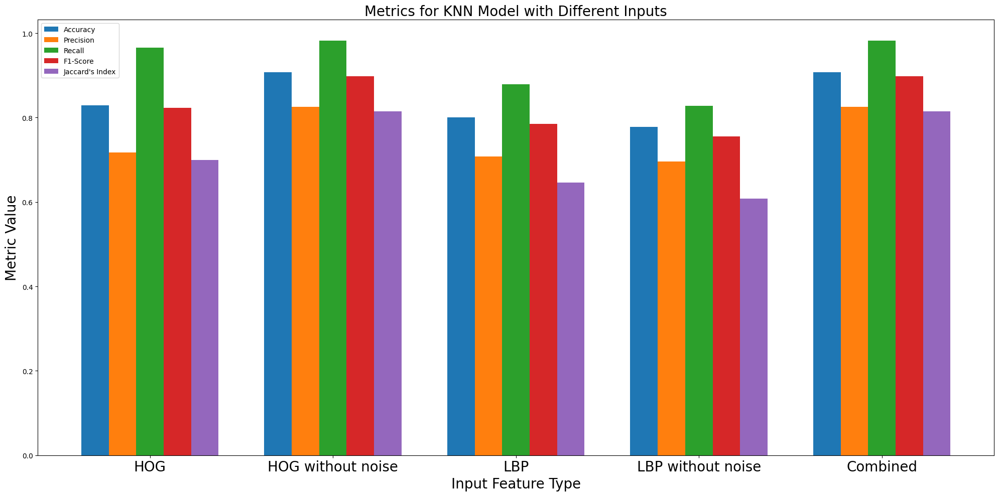

In [52]:
import matplotlib.pyplot as plt
import numpy as np

metrics = ["Accuracy", "Precision", "Recall", "F1-Score", "Jaccard's Index"]
input_types = list(results["KNN"].keys())
input_typesl = ["HOG","HOG without noise","LBP","LBP without noise","Combined"]

bar_width = 0.15
index = np.arange(len(input_types))

fig, ax = plt.subplots(figsize=(20,10))

for i, metric in enumerate(metrics):
    value = [results["KNN"][input_type][metric] for input_type in input_types]
    ax.bar(index + i * bar_width, value, bar_width, label=metric)

ax.set_xticks(index + bar_width * 2)
ax.set_xticklabels(input_typesl, fontsize=20)

ax.legend(fontsize=10)

ax.set_xlabel('Input Feature Type', fontsize=20)
ax.set_ylabel('Metric Value', fontsize=20)
ax.set_title('Metrics for KNN Model with Different Inputs', fontsize=20)

# Show the plot
plt.tight_layout()
plt.show()


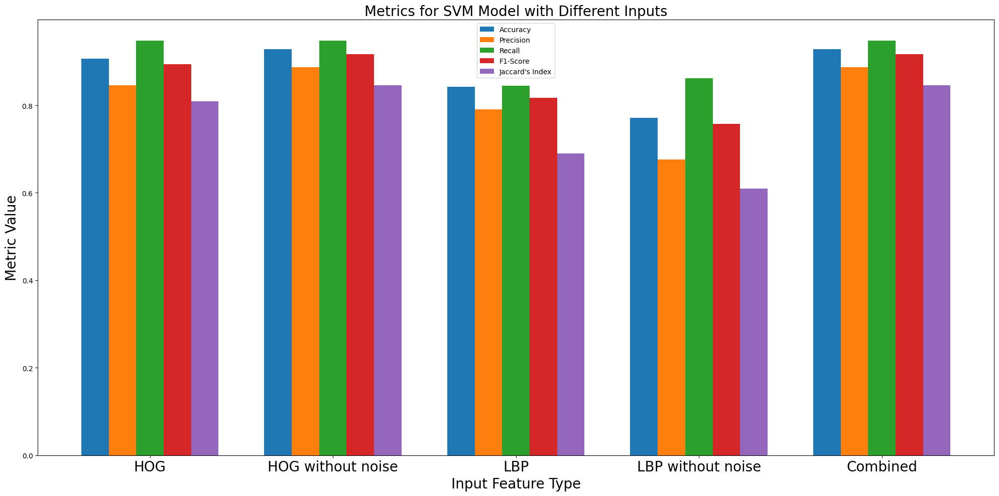

In [55]:
metrics = ["Accuracy", "Precision", "Recall", "F1-Score", "Jaccard's Index"]
input_types = list(results["SVM"].keys())
input_typesl = ["HOG","HOG without noise","LBP","LBP without noise","Combined"]

bar_width = 0.15
index = np.arange(len(input_types))

fig, ax = plt.subplots(figsize=(20, 10))

for i, metric in enumerate(metrics):
    value = [results["SVM"][input_type][metric] for input_type in input_types]
    ax.bar(index + i * bar_width, value, bar_width, label=metric)

ax.set_xticks(index + bar_width * 2)
ax.set_xticklabels(input_typesl, fontsize=20)

ax.legend(fontsize=10)

ax.set_xlabel('Input Feature Type', fontsize=20)
ax.set_ylabel('Metric Value', fontsize=20)
ax.set_title('Metrics for SVM Model with Different Inputs', fontsize=20)

# Show the plot
plt.tight_layout()
plt.show()


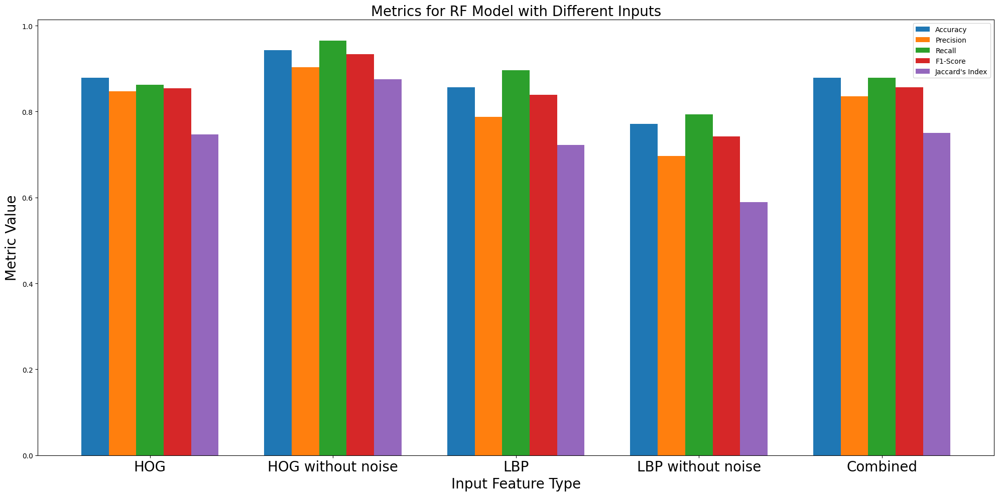

In [56]:
metrics = ["Accuracy", "Precision", "Recall", "F1-Score", "Jaccard's Index"]
input_types = list(results["Random Forest"].keys())
input_typesl = ["HOG","HOG without noise","LBP","LBP without noise","Combined"]

bar_width = 0.15
index = np.arange(len(input_types))

fig, ax = plt.subplots(figsize=(20, 10))

for i, metric in enumerate(metrics):
    value = [results["Random Forest"][input_type][metric] for input_type in input_types]
    ax.bar(index + i * bar_width, value, bar_width, label=metric)

ax.set_xticks(index + bar_width * 2)
ax.set_xticklabels(input_typesl, fontsize=20)

ax.legend(fontsize=10)

ax.set_xlabel('Input Feature Type', fontsize=20)
ax.set_ylabel('Metric Value', fontsize=20)
ax.set_title('Metrics for RF Model with Different Inputs', fontsize=20)

# Show the plot
plt.tight_layout()
plt.show()
